In [1]:
import logging, sys
import numpy as np
sys.path.insert(0, "../..")
import scirpy as ir
import scanpy as sc
from statistics import mean
from glob import glob
import pandas as pd
import math
import tarfile
import anndata
import warnings
import copy
from matplotlib import pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches
from numba import NumbaPerformanceWarning


## Since we have debugged the code and know that everything works fine, we now supress all kinds of unwanted messages generated
## and only keep the printed or necessary results. This is for the purpose of better readability of the .pdf report generated.

import warnings
warnings.simplefilter('ignore')

logging.disable(sys.maxsize)
## ignore numba performance warnings
warnings.filterwarnings("ignore", category=NumbaPerformanceWarning)

## suppress "storing XXX as categorical" warnings.
anndata.logging.anndata_logger.setLevel("ERROR")

In [2]:
annotated = sc.read('/scratch/annotated_umap.h5ad')

## Inspecting All trajectories

In [3]:
file = open('/scratch/all_trajectories.txt','r')
lines = file.readlines()
pseudotime_cluster_orders = []
for line in lines:  
    line = line.strip('\n')
    line = line.strip('"')
    order_as_cluster_number = line.split('->')
    order_as_cluster_annot = [annotated[annotated.obs['leiden_number']==order].obs['leiden'].iloc[0] for order in order_as_cluster_number]
    pseudotime_cluster_orders.append(order_as_cluster_annot)

In [4]:
connected_clusters = set()
for order in pseudotime_cluster_orders:
    for i in range(len(order)-1):
        if not (order[i+1],order[i]) in connected_clusters:
            connected_clusters.add((order[i],order[i+1]))


In [5]:
# find the coordinate of the centroid of each cluster
cluster_centroid = {}
for cluster in set(annotated.obs['leiden']):
    cluster_centroid_x = mean(coord[0] for coord in annotated[annotated.obs['leiden']==cluster].obsm['X_umap'])
    cluster_centroid_y = mean(coord[1] for coord in annotated[annotated.obs['leiden']==cluster].obsm['X_umap'])
    cluster_centroid[cluster] = (cluster_centroid_x, cluster_centroid_y)

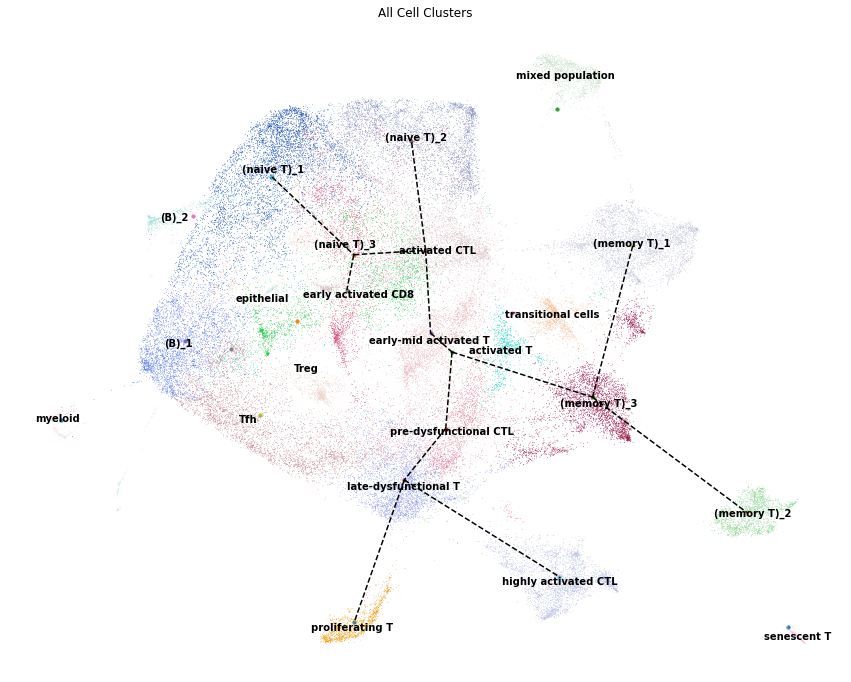

In [6]:
# plotting the trajectory on top of the UMAP
fig, ax = plt.subplots(figsize=(15,12))
for cluster in cluster_centroid:
    ax.scatter(cluster_centroid[cluster][0],cluster_centroid[cluster][1],s=10)
# use arrow to connect consecuitive clusters along the trajectory
for connection in connected_clusters:
    connected_clusters_x = [cluster_centroid[connection[0]][0], cluster_centroid[connection[1]][0]]
    connected_clusters_y = [cluster_centroid[connection[0]][1], cluster_centroid[connection[1]][1]]
    plt.plot(connected_clusters_x, connected_clusters_y, 'k--') 
sc.pl.umap(annotated, color='leiden', title='All Cell Clusters', legend_loc='on data',frameon=False,ax=ax)
fig_file = '/scratch/all_cluster_trajectories.svg'
fig.savefig(fig_file, format='svg', dpi=1200)

## Generating one specific trajectory

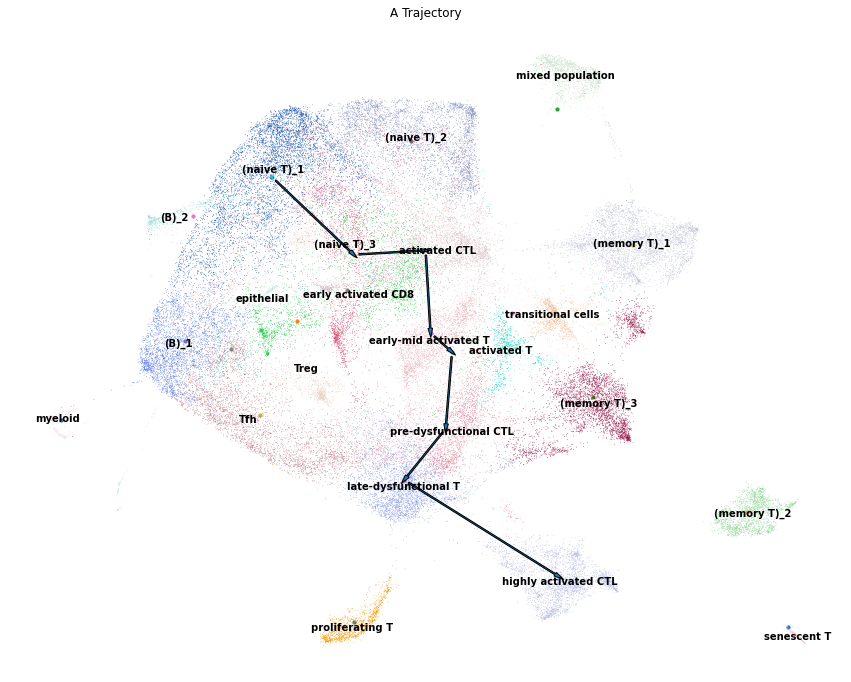

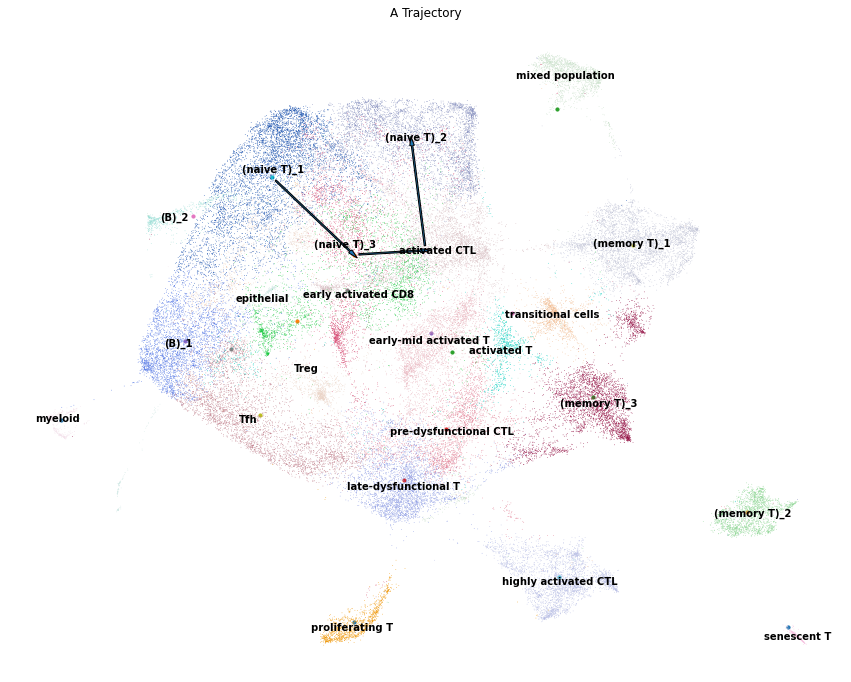

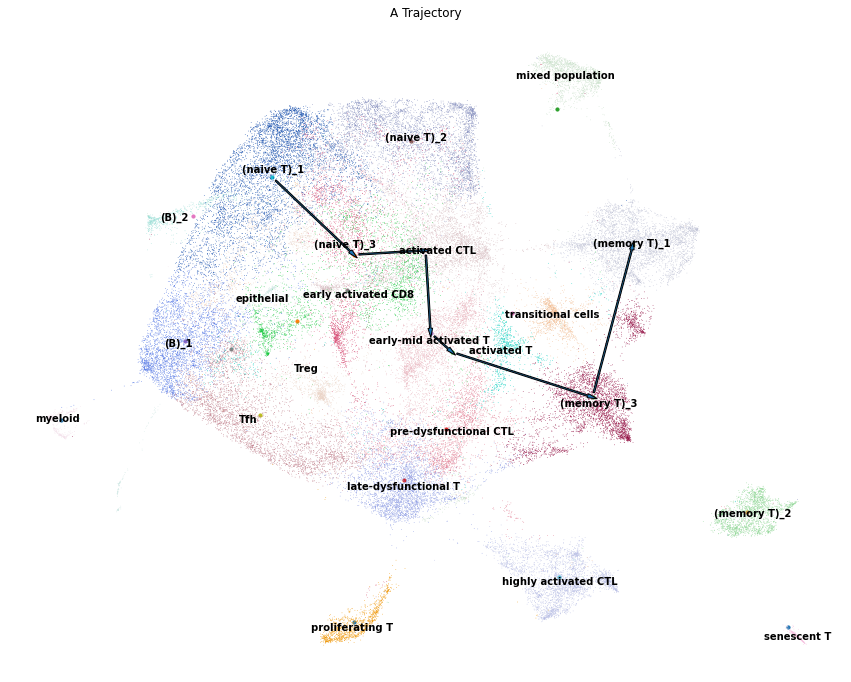

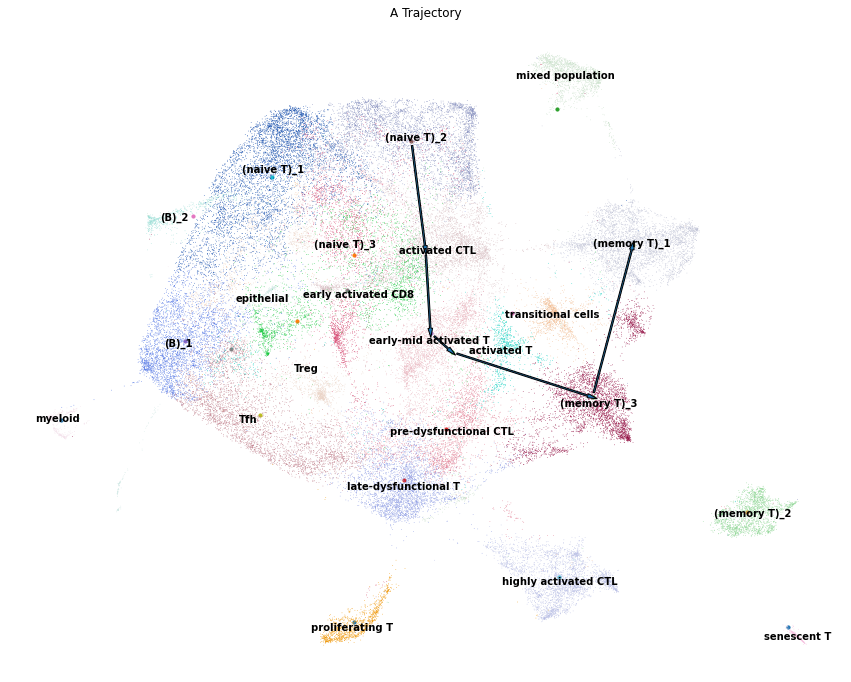

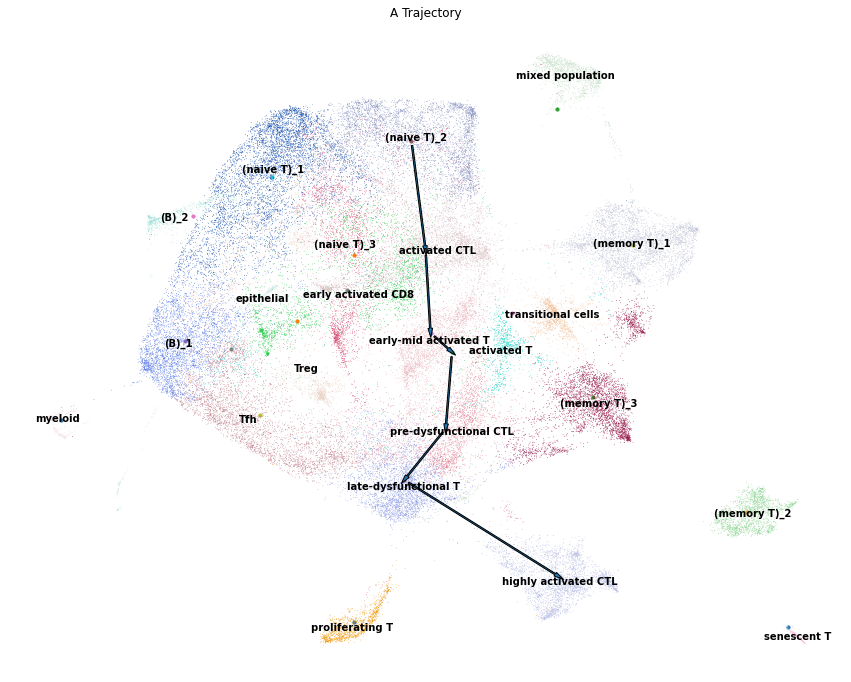

...

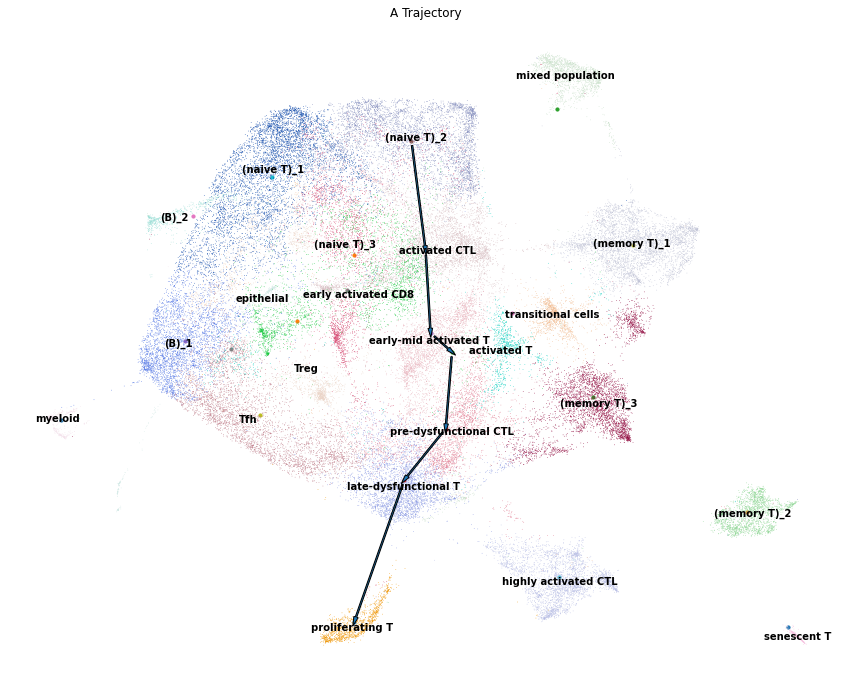

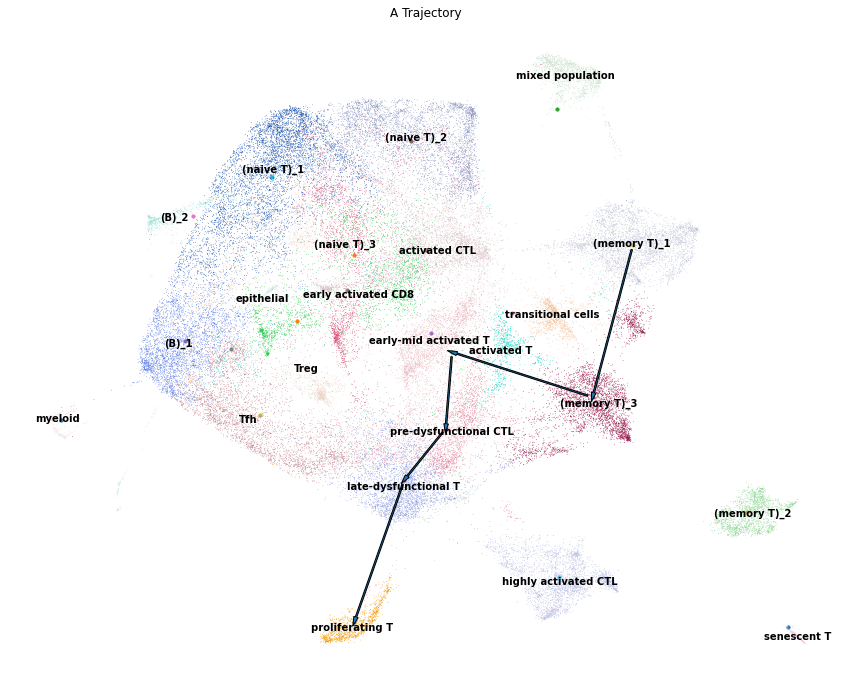

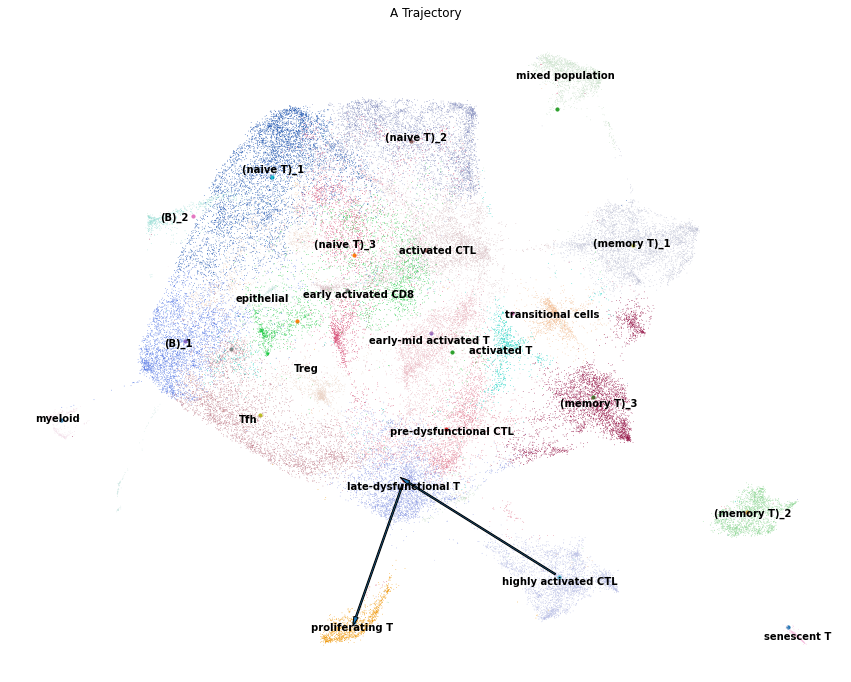

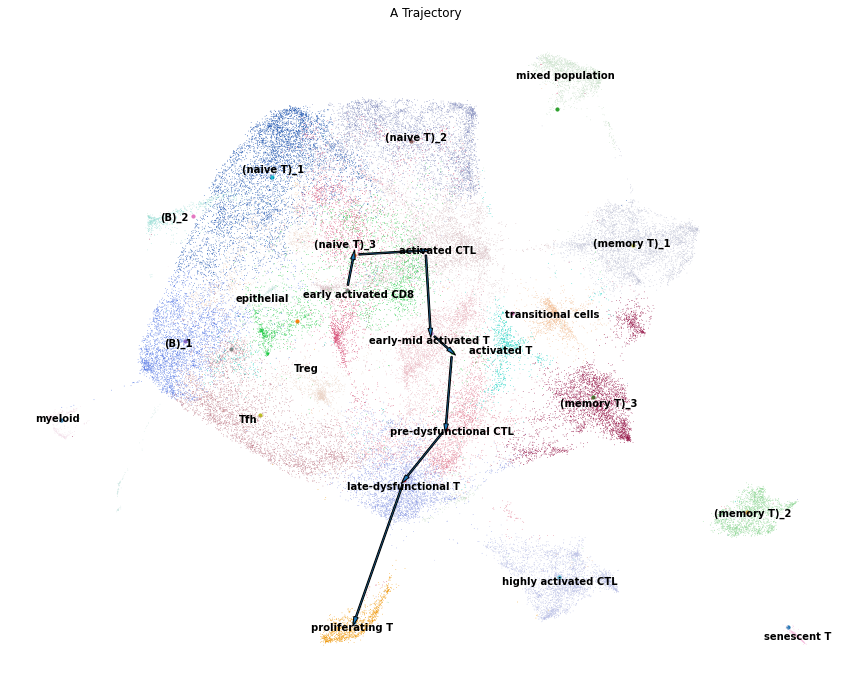

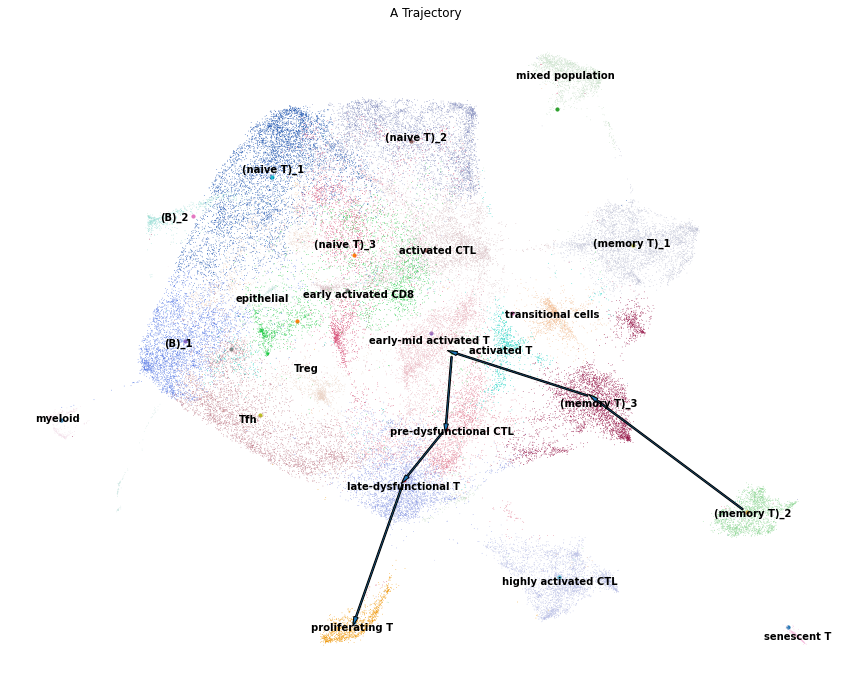

In [7]:
for pseudotime_cluster_order in pseudotime_cluster_orders:
    # plotting the trajectory on top of the UMAP
    fig, ax = plt.subplots(figsize=(15,12))
    for cluster in cluster_centroid:
        ax.scatter(cluster_centroid[cluster][0],cluster_centroid[cluster][1],s=10)
    # use arrow to connect consecuitive clusters along the trajectory
    for i in range(len(pseudotime_cluster_order)-1):
        start_x, start_y = cluster_centroid[pseudotime_cluster_order[i]]
        end_x, end_y = cluster_centroid[pseudotime_cluster_order[i+1]]
        dx, dy = (end_x-start_x, end_y-start_y)
        ax.arrow(start_x, start_y, dx, dy,width=0.03,length_includes_head=True,head_starts_at_zero=True,head_length=0.2)   
    sc.pl.umap(annotated, color='leiden', title='A Trajectory', legend_loc='on data',frameon=False,ax=ax)

## Differential expression analysis along CTL trajectory

In [72]:
CTL_pseudotime_and_genes = pd.read_csv("/scratch/CTL_genes_and_peudotime.txt",sep = ' ')

In [73]:
CTL_diff_exp_genes = list(CTL_pseudotime_and_genes['genes'].values)

In [74]:
CTL_pseudotime_cluster_order = [str(int(CTL_pseudotime_and_genes['order'].iloc[i])) for i in range(len(CTL_pseudotime_and_genes['order'])) if not math.isnan(CTL_pseudotime_and_genes['order'].iloc[i])]

In [75]:
CTL_pseudotime_cluster_order = [annotated[annotated.obs['leiden_number']==order].obs['leiden'].iloc[0] for order in CTL_pseudotime_cluster_order]

In [76]:
CTL_pseudotime_cluster_order

['(naive T)_1',
 '(naive T)_3',
 'early activated CD8',
 'early-mid activated T',
 'activated T',
 'pre-dysfunctional CTL',
 'late-dysfunctional T']

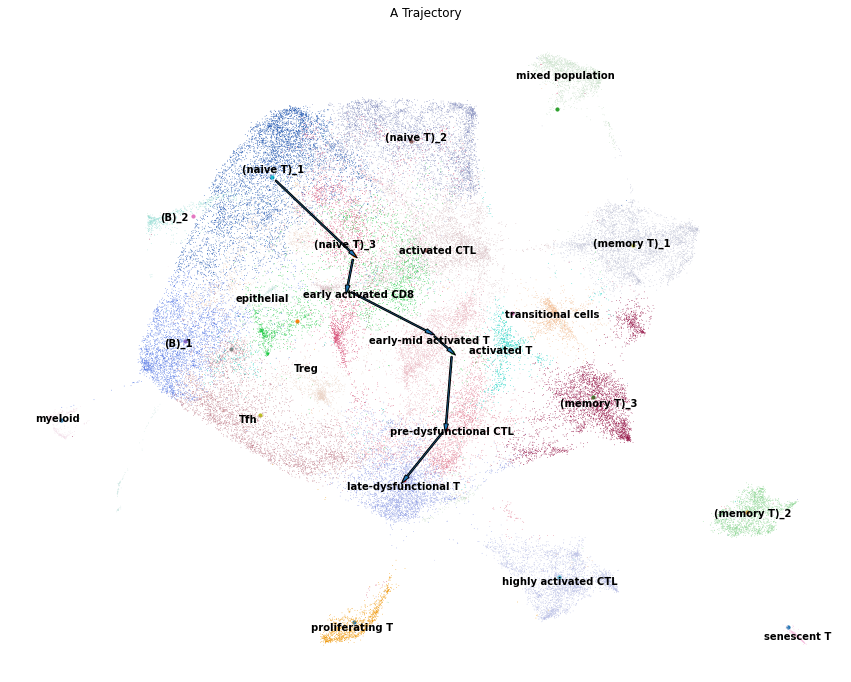

In [78]:
fig, ax = plt.subplots(figsize=(15,12))
for cluster in cluster_centroid:
    ax.scatter(cluster_centroid[cluster][0],cluster_centroid[cluster][1],s=10)
    # use arrow to connect consecuitive clusters along the trajectory
for i in range(len(pseudotime_cluster_order)):
    start_x, start_y = cluster_centroid[CTL_pseudotime_cluster_order[i]]
    end_x, end_y = cluster_centroid[CTL_pseudotime_cluster_order[i+1]]
    dx, dy = (end_x-start_x, end_y-start_y)
    ax.arrow(start_x, start_y, dx, dy,width=0.03,length_includes_head=True,head_starts_at_zero=True,head_length=0.2)   
sc.pl.umap(annotated, color='leiden', title='A Trajectory', legend_loc='on data',frameon=False,ax=ax)

In [79]:
CTL_expression_matrix = pd.read_csv('/scratch/CTL_trajectory_expression_data/exprMatrix.tsv',sep='\t',index_col=0)
CTL_trajectory_cells = sc.read('/scratch/annotated_trajectory_umap.h5ad')
CTL_expression_matrix = pd.concat([CTL_expression_matrix, pd.DataFrame(CTL_trajectory_cells.obs.loc[CTL_expression_matrix.columns]['leiden']).T])

In [80]:
# since not every cluster we selected to make trajectory analysis is guaranteed to show up in a single trajectory, we
# subset the cells that is actually on this trajectory
tmp = CTL_expression_matrix.T
tmp['cell'] = tmp.index
tmp = tmp.set_index('leiden').loc[CTL_pseudotime_cluster_order]
tmp['leiden'] = tmp.index
tmp = tmp.set_index('cell')
CTL_expression_matrix = tmp.T

In [81]:
CTL_expression_matrix

cell,AACTTTCCACTTCTGC-1-1,ACAGCCGCAATCCAAC-1-1,ACGAGGAAGCCAACAG-1-1,ATCTGCCCAATGGATA-1-1,CAGCGACAGAGGGATA-1-1,CTACACCCAGTGGGAT-1-1,CTCCTAGCATAGGATA-1-1,CTGGTCTCAATAGAGT-1-1,GATGAAACAGTCGTGC-1-1,GCTGCAGAGTTCGCGC-1-1,...,GACGTGCGTCCGCTGA-1-22,GATCGTAAGGCCATAG-1-22,GATTCAGGTCTAGCCG-1-22,GCTGCGATCTTGTCAT-1-22,GTAACGTCACAGACAG-1-22,GTGCGGTAGTATCGAA-1-22,GTGGGTCAGGATTCGG-1-22,TCAGATGCAGGGATTG-1-22,TTCTCAAGTCTTCTCG-1-22,TTGGAACCATCGGGTC-1-22
TNFRSF18,-0.000174438,-0.0316972,-0.00898725,-0.0430522,-0.0075467,-0.0252157,-0.00212343,-0.0392389,0.00160507,-0.00110656,...,-0.186854,-0.104996,-0.174382,1.51307,3.2668,-0.20604,-0.560551,-0.15567,1.49058,2.39806
TNFRSF4,0.0351687,0.0154033,0.0296429,0.00828353,0.0305461,0.0166731,0.0339466,0.0106745,0.0362845,0.0345842,...,-0.0818827,-0.0305565,-0.0716444,-0.113053,-0.110485,-0.0963053,-0.316198,-0.0623299,-0.111466,-0.106872
MXRA8,0.0254988,0.0155999,0.0227314,0.0120341,0.0231838,0.00770883,0.0248868,0.0132315,0.0260577,0.0252061,...,-0.0331234,-0.00741797,0.00464057,-0.0526187,-0.0552165,-0.0449894,-0.150474,-0.0233309,0.127654,-0.053407
TNFRSF9,-0.0813252,-0.105944,-0.0882078,-0.114812,-0.0870828,-0.0978369,-0.0828474,-0.111834,-0.0799355,-0.0820532,...,-0.227117,1.23781,-0.219991,5.33898,-0.26087,-0.239491,5.08502,-0.202763,1.10144,-0.25637
MFAP2,0.0230841,0.013781,0.0204833,0.0104299,0.0209084,0.00571942,0.0225089,0.0115553,0.0236093,0.022809,...,-0.0320091,-0.00785109,0.00267563,-0.0502799,-0.0526704,-0.0438572,-0.142295,-0.022806,0.115655,-0.0509698
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
COL6A1,0.0239651,0.0154066,0.0215724,0.0123237,0.0219635,0.0061754,0.023436,0.013359,0.0244483,0.023712,...,-0.0267188,-0.00449427,0.0149879,-0.0446542,-0.0479803,-0.0383066,-0.128179,-0.0182523,0.161058,-0.0464159
COL6A2,0.0232714,0.0130162,0.0204044,0.00932215,0.020873,0.00423561,0.0226374,0.0105627,0.0238503,0.0229682,...,-0.0374603,-0.0108299,0.00488056,-0.0580277,-0.0610895,-0.0499882,-0.159034,-0.0273153,0.146168,-0.0592149
S100B,0.0499378,0.0326867,0.0451149,0.0264726,0.0459033,0.0347783,0.0488712,0.0285594,0.0509117,0.0494277,...,2.72349,-0.00742676,-0.0431847,-0.0793887,-0.077106,-0.0638694,-0.256733,-0.0351584,-0.0785514,-0.0739526
AC233755.2,0.036619,0.0277867,0.0341498,0.0246052,0.0345534,0.0271883,0.0360729,0.0256736,0.0371176,0.0363579,...,-0.0156861,0.00724931,-0.00685243,-0.0301246,-0.0294865,-0.0227872,-0.120391,-0.00694882,-0.00593672,-0.027872


We write a function to plot a heat map for cluster-level average expression of all differentially expressed genes along a trajectory where x-axis are cell clusters in pseudotemporal order, y-axis are genes. The function relies on seaborn.clustermap.

Input:

    anndata: scanpy object that containes all necessary information 

    expression_matrix: the matrix contains the expression of genes of all cells of interest. with the rows being genes and columns being cells. The last row of expression_matrix contains the cluster assignment of each cell based on UMAP and Leiden algorithm. 

    trajectory_expression_matrix: the expression matrix of cells and genes along the trajectory, columns are cells, rows are genes

    diff_exp_genes: the differentially expressed genes that are detected by pseudotime analysis softwares

    rescale: if True, all positive values will be scaled between 0 and 1, all negative values will be scaled between -1 and 0. The scaling method is, for positive expression value x: x/max_x; for negative expression value x: -(x/min_x) where max_x and min_x are the maximum and minimum expression of a gene across all involved cells along trajectory.

    mod_out_first: if True, we compare the expression level of subsequence clusters to the first cluster along the trajectory. Mathematically this means that we compute $$\text{modded cluster exp} = \text{original cluster exp} - \text{first cluster exp}$$ where $\text{modded cluster exp}$ is the average expression level of a gene in a cluster that has been modded by the first cluster exp. 

Output: 
     
     expression_matrix: an dataframe with reorganized genes and cells

In [17]:
def reorder_genes_along_trajectory(anndata, trajectory_expression_matrix, pseudotime_ordered_clusters, diff_exp_genes, rescale=None, mod_out_first=False, ascending=True):
    import pandas as pd
    import seaborn as sns
    import copy
    
    
    # extract genes of interest
    expression_matrix = trajectory_expression_matrix # simply renaming
    diff_exp_genes = list(diff_exp_genes) + ['leiden']
    expression_matrix = expression_matrix.loc[diff_exp_genes]
    # order cells according to pseudotime ordering of the clusters
    #cell_ordering = pd.DataFrame(columns=expression_matrix.index, index=['cluster_order'])
    #for cell in cell_ordering.columns:
    #    cell_ordering[cell] = pseudotime_ordered_clusters.index(expression_matrix.loc['leiden'][cell])
    #expression_matrix = pd.concat([expression_matrix.T, cell_ordering])
    #expression_matrix = expression_matrix.T.sort_values(by='cluster_order').T
    #expression_matrix = expression_matrix.iloc[:-1]
    
    # get the cluster average of all cells
    tmp = expression_matrix.T
    cluster_avg_expression = pd.DataFrame(index=expression_matrix.index)
    for cluster in pseudotime_ordered_clusters:
        cluster_expression_matrix = tmp[tmp['leiden']==cluster].T
        cluster_avg_expression[cluster] = cluster_expression_matrix.drop('leiden',axis=0).mean(axis=1)
    cluster_avg_expression = cluster_avg_expression.drop('leiden',axis=0)
    
    # modding out the first cluster as the base level
    tmp = cluster_avg_expression
    if mod_out_first == True:
        naive_cluster = cluster_avg_expression.columns[0]
        for cluster in cluster_avg_expression.columns:
            tmp[cluster] = cluster_avg_expression[cluster]-cluster_avg_expression[naive_cluster]
        
    # rescale the gene expression to between -1 and 1
    cluster_avg_expression = copy.deepcopy(tmp)
    if rescale==True:
        tmp['min'] = tmp.min(axis=1)
        tmp['max'] = tmp.max(axis=1)
        for cluster in cluster_avg_expression.columns:
            for gene in cluster_avg_expression.index:
                if cluster_avg_expression.loc[gene][cluster]>0:
                    cluster_avg_expression.loc[gene][cluster] = min(1,cluster_avg_expression.loc[gene][cluster]/tmp.loc[gene]['max'])
                else:
                    cluster_avg_expression.loc[gene][cluster] = max(-1,-(cluster_avg_expression.loc[gene][cluster]/tmp.loc[gene]['min']))
    
    if ascending == False:
        # here we reorder the cluster average expression in descending order
        # idea: for each j, sort genes expression level in descending order, then fixed the location of top genes, increment j and repeat
        j = 0  # iterate through cluster with j
        i = 0  # iterate through genes with i
        while j < cluster_avg_expression.shape[1]:
            cluster = cluster_avg_expression.columns[j]
            kept_rows = cluster_avg_expression.iloc[:i]
            new_sorted_rows = cluster_avg_expression.iloc[i:].sort_values(by=cluster, axis=0, ascending=False)
            cluster_avg_expression = pd.concat([kept_rows, new_sorted_rows], axis=0)
            # determine the row index where we keep all rows above and sort all rows below
            k = i
            while k<cluster_avg_expression.shape[0] and cluster_avg_expression.iloc[k][cluster]==max(cluster_avg_expression.iloc[k]):
                k += 1
            i = k
            if i >= cluster_avg_expression.shape[0]:
                break
            j += 1
    if ascending == True:
        # here we reorder the cluster average expression in ascending order
        # idea: for each j, sort genes expression level in ascending order, then fixed the location of top genes, increment j and repeat
        j = 0  # iterate through cluster with j
        i = 0  # iterate through genes with i
        while j < cluster_avg_expression.shape[1]:
            cluster = cluster_avg_expression.columns[j]
            kept_rows = cluster_avg_expression.iloc[:i]
            new_sorted_rows = cluster_avg_expression.iloc[i:].sort_values(by=cluster, axis=0, ascending=True)
            cluster_avg_expression = pd.concat([kept_rows, new_sorted_rows], axis=0)
            # determine the row index where we keep all rows above and sort all rows below
            k = i
            while k<cluster_avg_expression.shape[0] and cluster_avg_expression.iloc[k][cluster]==min(cluster_avg_expression.iloc[k]):
                k += 1
            i = k
            if i >= cluster_avg_expression.shape[0]:
                break
            j += 1
    return cluster_avg_expression


In [112]:
CTL_cluster_avg_expression_descend= reorder_genes_along_trajectory(annotated, CTL_expression_matrix, CTL_pseudotime_cluster_order, CTL_diff_exp_genes, 
                                                               rescale=True, mod_out_first=False, ascending=False)
CTL_cluster_avg_expression_ascend = reorder_genes_along_trajectory(annotated, CTL_expression_matrix, CTL_pseudotime_cluster_order, CTL_diff_exp_genes, 
                                                               rescale=True, mod_out_first=False, ascending=True)

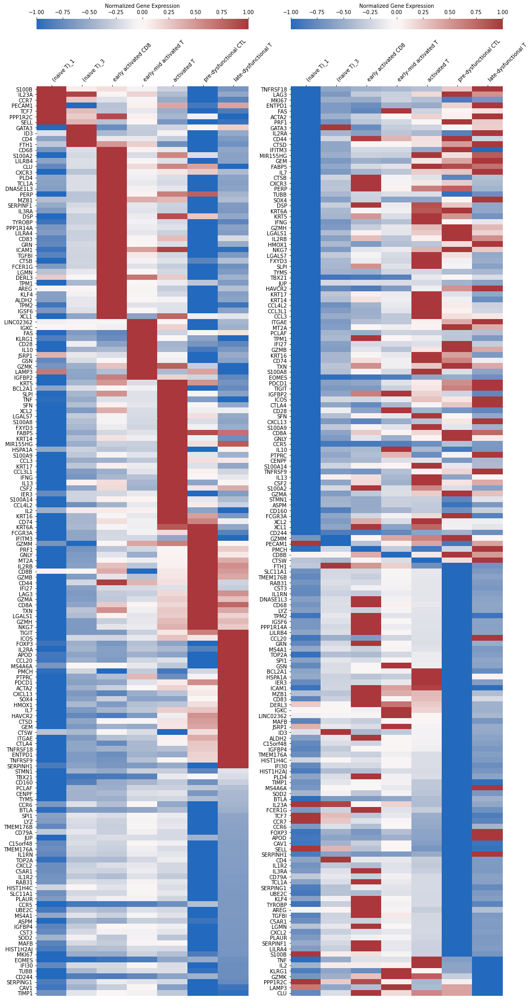

In [90]:


fig, (ax1,ax2) = plt.subplots(1, 2,sharex=False,gridspec_kw={'width_ratios': [1, 1]}, figsize=(16,40))
#fig, ax = plt.subplots(figsize=(8,40))
sns.heatmap(CTL_cluster_avg_expression_descend, cmap='vlag', ax=ax1,cbar_kws = dict(use_gridspec=False,location="top",label='Normalized Gene Expression'))
sns.heatmap(CTL_cluster_avg_expression_ascend, cmap='vlag', ax=ax2,cbar_kws = dict(use_gridspec=False,location="top",label='Normalized Gene Expression'))
ax1.xaxis.tick_top() # x axis on top
ax2.xaxis.tick_top()
#ax.set_title('Normalized Gene Expression',fontsize=20)
ax1.xaxis.set_label_position('top')
ax2.xaxis.set_label_position('top')
plt.setp(ax1.get_xticklabels(), rotation=45, ha="left")
plt.setp(ax2.get_xticklabels(), rotation=45, ha="left")
plt.show()

In [21]:
def plot_genes_along_trajectory(expression_matrix, genes,order, show_median=False):
    fig, ax = plt.subplots(figsize = (15,10))
    if not show_median:
        cluster_mean = expression_matrix.T.apply(pd.to_numeric, errors='ignore').groupby('leiden', as_index=False).mean()
        cluster_mean = cluster_mean.set_index('leiden')
        cluster_mean = cluster_mean.reindex(order)
        for gene in genes:
            ax.plot(cluster_mean[gene],label=gene)
        ax.set_title('Cluster Mean Expression', fontsize=20)
    else:
        cluster_median = expression_matrix.T.apply(pd.to_numeric, errors='ignore').groupby('leiden', as_index=False).median()
        cluster_median = cluster_median.set_index('leiden')
        cluster_median = cluster_median.reindex(order)
        for gene in genes:
            ax.plot(cluster_median[gene],label=gene)
        ax.set_title('Cluster Median Expression', fontsize=20)
        
    ax.set_ylabel('log-expression',fontsize=15)
    ax.set_xlabel('cluster',fontsize=15)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
    plt.legend()
    plt.show()

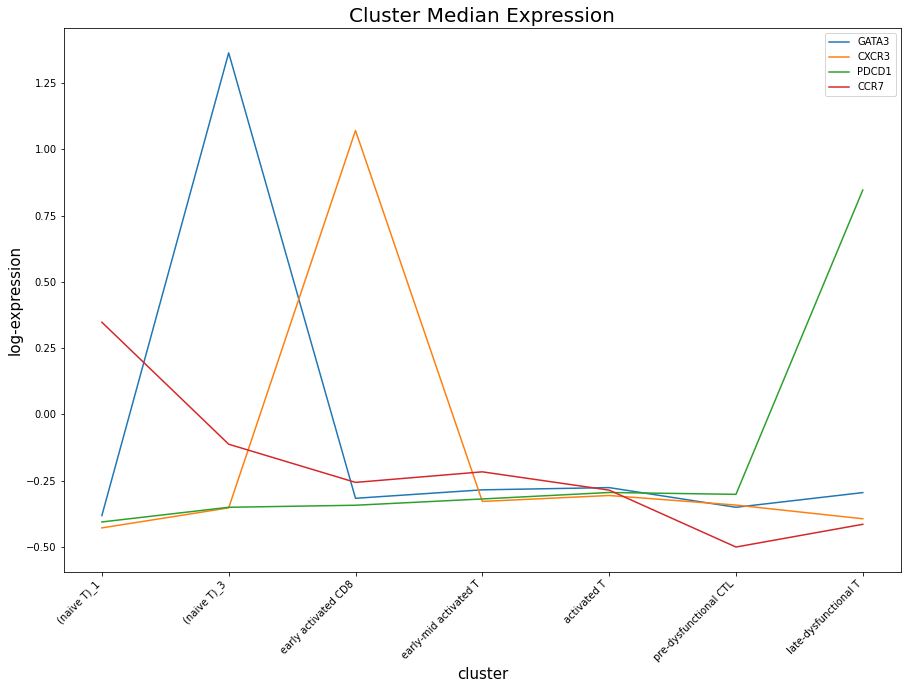

In [91]:
genes = ['GATA3','CXCR3','PDCD1','CCR7']
plot_genes_along_trajectory(CTL_expression_matrix, genes, CTL_pseudotime_cluster_order, show_median=True)

In [23]:
def plot_gene_boxplot_along_trajectory(expression_matrix, gene, order, show_mean=False, show_median=True):
    fig, ax = plt.subplots(figsize = (15,10))
    #for gene in genes:
    #    ax.plot(expression_matrix.loc[gene],label=gene)
    sub_exp_matrix = pd.concat([expression_matrix.loc['leiden'],expression_matrix.loc[gene].astype('float')], axis=1)    
    sns.boxplot(x='leiden', y=gene, data=sub_exp_matrix, showfliers=False, whis=1.5,ax=ax,order=order,palette="Set3")
    # compute median and mean
    cluster_median = sub_exp_matrix.groupby('leiden', as_index=False).median()
    cluster_mean = sub_exp_matrix.groupby('leiden', as_index=False).mean()
    
    if show_median:
        sns.pointplot(x='leiden', y=gene, data=cluster_median, ax=ax,order=order, color='r',legend='auto')
    if show_mean:
        sns.pointplot(x='leiden', y=gene, data=cluster_mean, ax=ax, order=order, color='b', legend='auto')
    ax.set_ylabel('log-expression',fontsize=15)
    ax.set_xlabel('cluster',fontsize=15)
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right")
    ax.set_title('Cluster Median and Mean for '+gene, fontsize=20)
    plt.show()

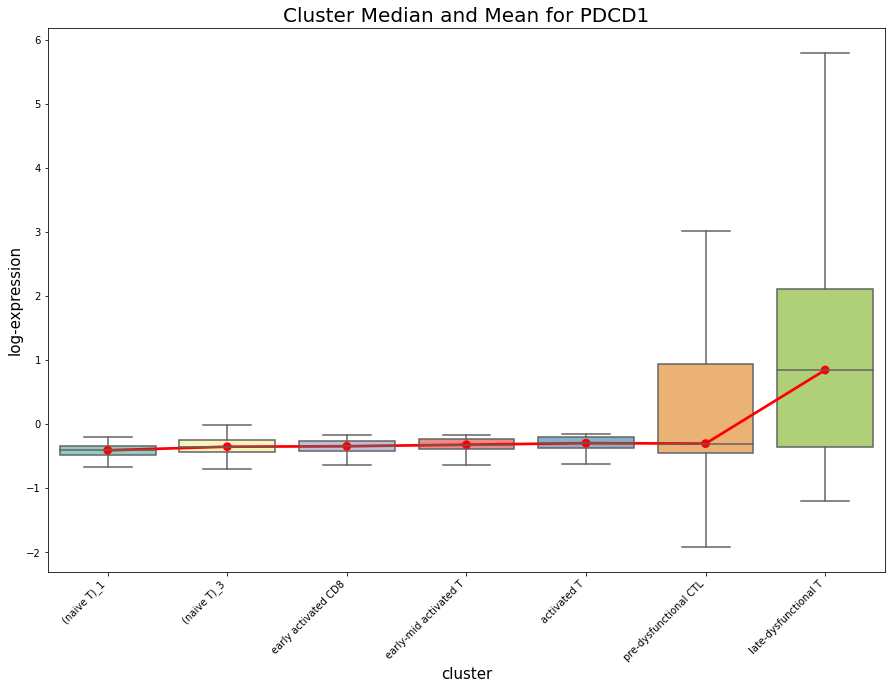

In [115]:
gene = 'PDCD1'
plot_gene_boxplot_along_trajectory(CTL_expression_matrix, gene, CTL_pseudotime_cluster_order,show_median=True,show_mean=False)

In [113]:
import plotly.graph_objects as go
CTL_exp_matrix = CTL_cluster_avg_expression_descend.T.values[::-1]
CTL_genes = CTL_cluster_avg_expression_descend.index
CTL_clusters = CTL_pseudotime_cluster_order[::-1]

fig = go.Figure(data=go.Heatmap(
        z=CTL_exp_matrix,
        x=CTL_genes,
        y=CTL_clusters,
        colorscale='Picnic'))
fig.show()

In [99]:
fig.write_html("/scratch/CTL_trajectory_exp_ascending.html")

## Differential Expression Along Memory Trajectory

In [101]:
pseudotime_and_genes = pd.read_csv("/scratch/memory_genes_and_peudotime.txt",sep = ' ')
mem_diff_exp_genes = list(pseudotime_and_genes['genes'].values)

In [102]:
mem_pseudotime_cluster_order = ['(naive T)_2','activated CTL','early-mid activated T','activated T','(memory T)_3',
                            '(memory T)_1']

In [103]:
mem_expression_matrix = pd.read_csv('/scratch/memory_trajectory_expression_data/exprMatrix.tsv',sep='\t',index_col=0)

In [104]:
mem_trajectory_cells = sc.read('/scratch/annotated_memory_trajectory_umap.h5ad')
mem_expression_matrix = pd.concat([memory_expression_matrix, pd.DataFrame(memory_trajectory_cells.obs.loc[memory_expression_matrix.columns]['leiden']).T])

In [105]:
# two rows called 'leiden', delete one for now and debug later
mem_expression_matrix = mem_expression_matrix.iloc[:-1]

In [106]:
# since not every cluster we selected to make trajectory analysis is guaranteed to show up in a single trajectory, we
# subset the cells that is actually on this trajectory
tmp = mem_expression_matrix.T
tmp['cell'] = tmp.index
tmp = tmp.set_index('leiden').loc[mem_pseudotime_cluster_order]
tmp['leiden'] = tmp.index
tmp = tmp.set_index('cell')
mem_expression_matrix = tmp.T

In [107]:
mem_cluster_avg_expression_descend= reorder_genes_along_trajectory(annotated, mem_expression_matrix, mem_pseudotime_cluster_order, mem_diff_exp_genes, 
                                                               rescale=True, mod_out_first=False, ascending=False)
mem_cluster_avg_expression_ascend = reorder_genes_along_trajectory(annotated, mem_expression_matrix, mem_pseudotime_cluster_order, mem_diff_exp_genes, 
                                                               rescale=True, mod_out_first=False, ascending=True)

In [110]:
import plotly.graph_objects as go
mem_exp_matrix = mem_cluster_avg_expression_ascend.T.values[::-1]
mem_genes = mem_cluster_avg_expression_ascend.index
mem_clusters = mem_pseudotime_cluster_order[::-1]

fig = go.Figure(data=go.Heatmap(
        z=mem_exp_matrix,
        x=mem_genes,
        y=mem_clusters,
        colorscale='Picnic'))
fig.show()

In [111]:
fig.write_html("/scratch/mem_trajectory_exp_ascending.html")

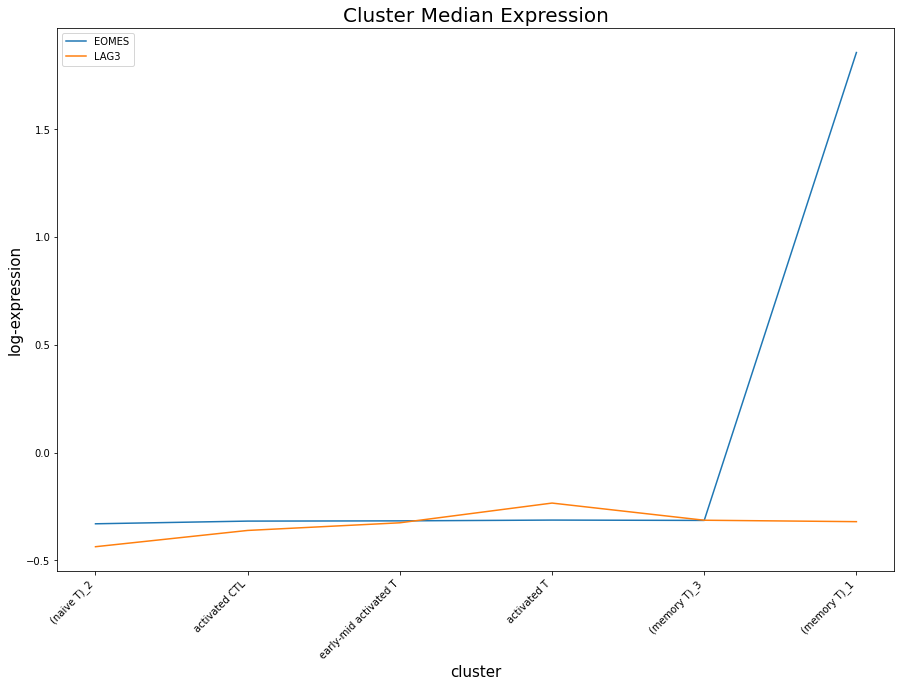

In [69]:
genes = ['EOMES','LAG3']
plot_genes_along_trajectory(mem_expression_matrix, genes, mem_pseudotime_cluster_order, show_median=True)

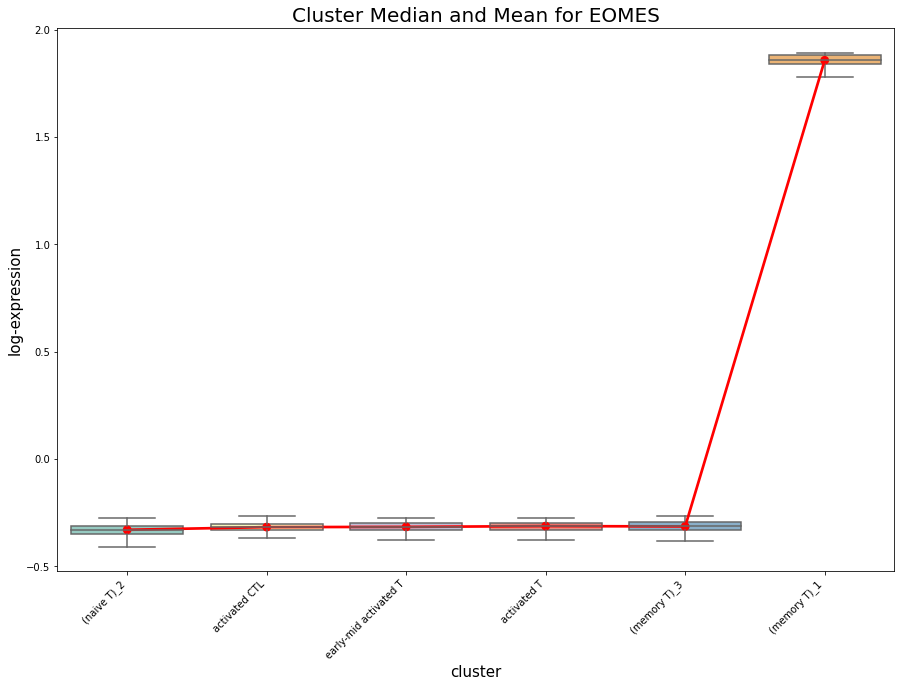

In [86]:
gene = 'EOMES'
plot_gene_boxplot_along_trajectory(mem_expression_matrix, gene, mem_pseudotime_cluster_order,show_median=True,show_mean=False)